**Name:** Bala Guga Gopal S

**Experiment Name:**  GAN - for Data augmentation for Image Classification

In [ ]:
# importing google drive to create the work space
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd '/content/gdrive/MyDrive/DNN/GAN/5_2'

/content/gdrive/MyDrive/DNN/GAN/5_2


In [ ]:
# Configure Working directory to for Kaggle Json image (important to download the dataset from Kaggle to google drive via colab)
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/Colab Notebooks/Kaggle"

***Dataset***

https://www.kaggle.com/datasets/mloey1/covid19-chest-ct-image-augmentation-gan-dataset

In [ ]:
#dataset download from kaggle
!kaggle datasets download -d mloey1/covid19-chest-ct-image-augmentation-gan-dataset

100% 1.77G/1.78G [00:59<00:00, 39.8MB/s]
100% 1.78G/1.78G [00:59<00:00, 32.0MB/s]


In [ ]:
# Unzip the folders and to delete the .zip file.
!unzip \*.zip  && rm *.zip

Streaming output truncated to the last 5000 lines.
  inflating: COVID-19CGAN/COVID-19+CGAN/test/COVID/Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%10.png  
  inflating: COVID-19CGAN/COVID-19+CGAN/test/COVID/Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%11.png  
  inflating: COVID-19CGAN/COVID-19+CGAN/test/COVID/Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%2.png  
  inflating: COVID-19CGAN/COVID-19+CGAN/test/COVID/Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%3.png  
  inflating: COVID-19CGAN/COVID-19+CGAN/test/COVID/Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%4.png  
  inflating: COVID-19CGAN/COVID-19+CGAN/test/COVID/Comparison-of-different-samples-for-2019-novel-cor_2020_International-Journa-p2-21%5.png  
  inflating: COVID-19CGAN/COVID-19+CGAN/test/COVID/Comparison-of-different-samples-for-2019-nov

In [ ]:
ls

COVID-19/  COVID-19Aug/  COVID-19AugCGAN/  COVID-19CGAN/


# Import Libraries

In [ ]:
# Import necessary libraries.
import os
import glob
import imageio
import random, shutil
import torch
import torch.nn as nn
from tqdm.notebook import tqdm
import torch.nn.functional as F
import torchvision.datasets as datasets
from torchvision.utils import make_grid
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as display

# Dataset Load

In [ ]:
train_dir='/content/gdrive/MyDrive/DNN/GAN/5_2/COVID-19/COVID-19/test'
val_dir= '/content/gdrive/MyDrive/DNN/GAN/5_2/COVID-19/COVID-19/val'

In [ ]:
train_dataset = datasets.ImageFolder(
    train_dir,
    transforms.Compose([transforms.Resize( (256,256)) ,
        transforms.ToTensor(),
    ]))

train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=128, shuffle=True, num_workers=0)

val_dataset = datasets.ImageFolder(
    val_dir,
    transforms.Compose([
        transforms.ToTensor(),
    ]))

val_loader = torch.utils.data.DataLoader(
    val_dataset, batch_size=128, shuffle=True, num_workers=0)

In [ ]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#Generator

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=3, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
                                    self.make_gen_block(z_dim, hidden_dim * 4),
                                    self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
                                    self.make_gen_block(hidden_dim * 2, hidden_dim),
                                    self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
                                )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN, 
        corresponding to a transposed convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''

        #     Steps:
        #       1) Do a transposed convolution using the given parameters.
        #       2) Do a batchnorm, except for the last layer.
        #       3) Follow each batchnorm with a ReLU activation.
        #       4) If its the final layer, use a Tanh activation after the deconvolution.

        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                #### START CODE HERE ####
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU()
                #### END CODE HERE ####
            )
        else: # Final Layer
            return nn.Sequential(
                #### START CODE HERE ####
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh()               
                #### END CODE HERE ####
            )

    def unsqueeze_noise(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns a copy of that noise with width and height = 1 and channels = z_dim.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return noise.view( len(noise), self.z_dim , 1 , 1 ) # num of samples , z_dim , h , w

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = self.unsqueeze_noise(noise)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#Discriminator

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
    hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=3, hidden_dim=16):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
                                    self.make_disc_block(im_chan, hidden_dim),
                                    self.make_disc_block(hidden_dim, hidden_dim * 2),
                                    self.make_disc_block(hidden_dim * 2 , 1 , final_layer=True),
                                )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of DCGAN, 
        corresponding to a convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        #     Steps:
        #       1) Add a convolutional layer using the given parameters.
        #       2) Do a batchnorm, except for the last layer.
        #       3) Follow each batchnorm with a LeakyReLU activation with slope 0.2.
        
        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                #### START CODE HERE #### #
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2)
                #### END CODE HERE ####
            )
        else: # Final Layer
            return nn.Sequential(
                #### START CODE HERE #### #
                nn.Conv2d(input_channels, output_channels, kernel_size, stride)
                
                #### END CODE HERE ####
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [ ]:
criterion = nn.BCEWithLogitsLoss()
z_dim = 64
display_step = 500
batch_size = 128
# A learning rate of 0.0002 works well on DCGAN
lr = 0.0002
beta_1 = 0.5 
beta_2 = 0.999
device = 'cuda'

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

# You initialize the weights to the normal distribution
# with mean 0 and standard deviation 0.02
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Step 200: Generator loss: 0.2805468142032623, discriminator loss: 0.27312801933288566


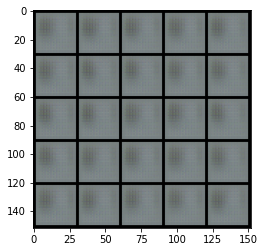

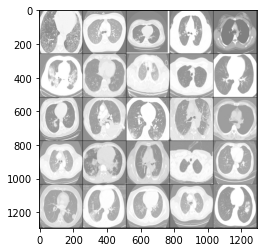

Step 400: Generator loss: 0.27651574087142955, discriminator loss: 0.2701526567935944


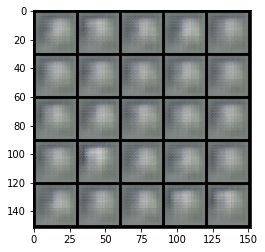

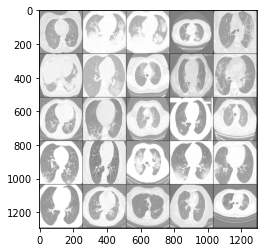

Step 600: Generator loss: 0.2917658028602599, discriminator loss: 0.2663354709148409


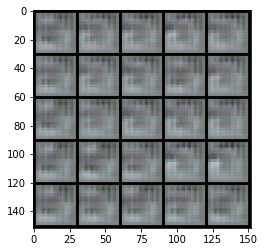

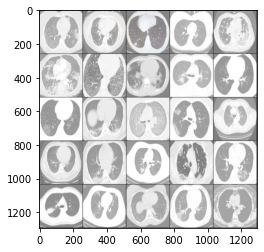

Step 800: Generator loss: 0.28192621809244156, discriminator loss: 0.27198225164413453


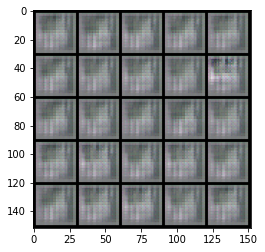

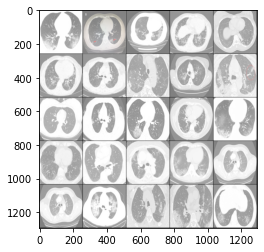

Step 1000: Generator loss: 0.2809654755592346, discriminator loss: 0.2748103671073912


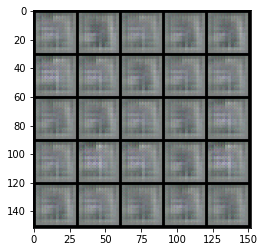

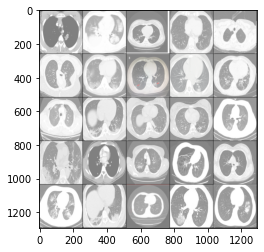

Step 1200: Generator loss: 0.2915164839029312, discriminator loss: 0.2688906818628311


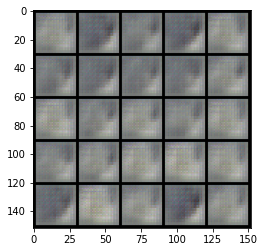

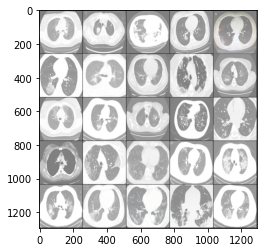

Step 1400: Generator loss: 0.280178463459015, discriminator loss: 0.27707809460163096


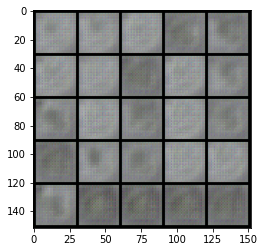

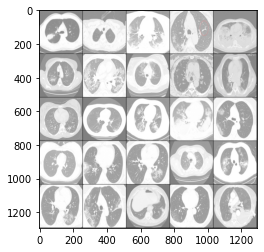

Step 1600: Generator loss: 0.27770994985103603, discriminator loss: 0.2777706019878388


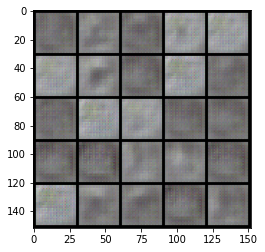

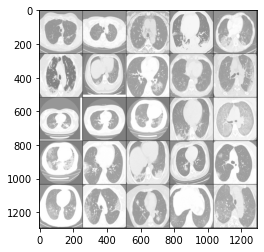

Step 1800: Generator loss: 0.28055210459232344, discriminator loss: 0.27660388481617


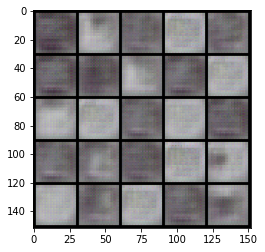

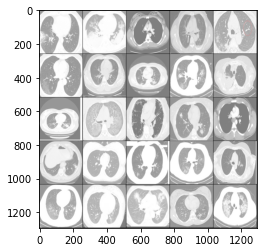

Step 2000: Generator loss: 0.2787582137584685, discriminator loss: 0.27674300682544706


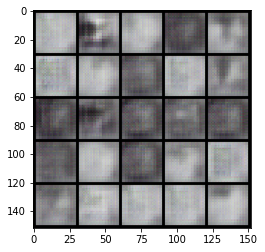

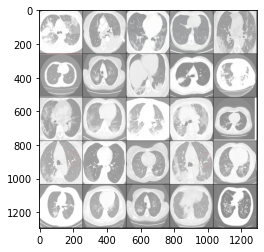

Step 2200: Generator loss: 0.2785342109203338, discriminator loss: 0.27738870561122897


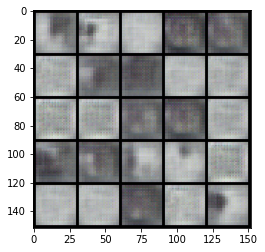

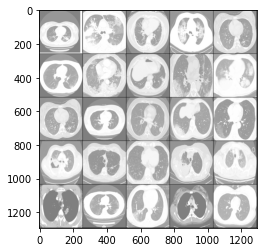

Step 2400: Generator loss: 0.27766521620750434, discriminator loss: 0.2772751256227493


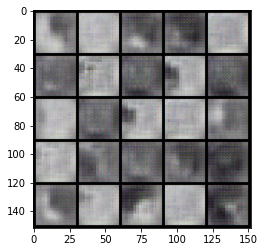

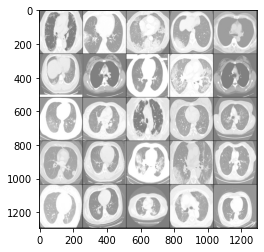

Step 2600: Generator loss: 0.27813192486763005, discriminator loss: 0.27717206358909596


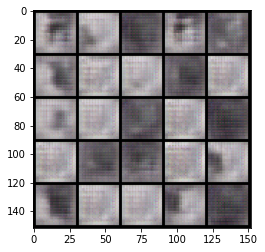

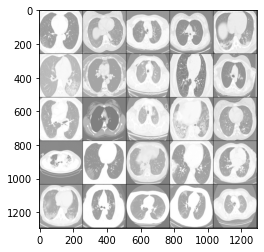

Step 2800: Generator loss: 0.2786303641796112, discriminator loss: 0.2773803436756132


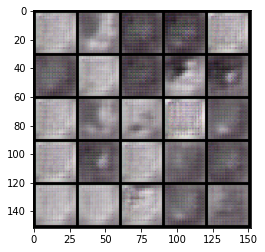

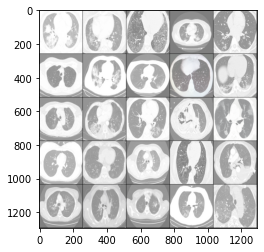

Step 3000: Generator loss: 0.2792618917226794, discriminator loss: 0.277097923398018


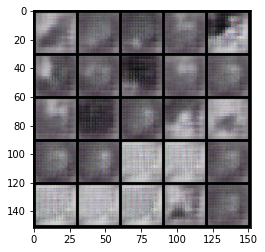

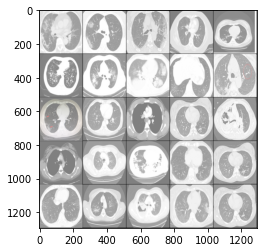

Step 3200: Generator loss: 0.27882234382629406, discriminator loss: 0.27698697102069847


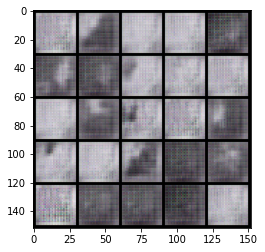

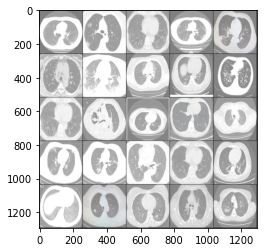

Step 3400: Generator loss: 0.278853112101555, discriminator loss: 0.27695779705047624


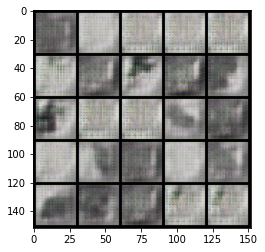

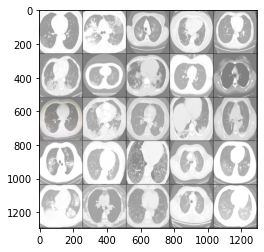

Step 3600: Generator loss: 0.2788399245738982, discriminator loss: 0.27668819868564587


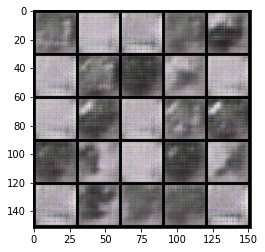

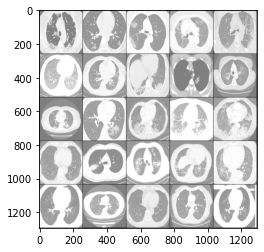

Step 3800: Generator loss: 0.278528468489647, discriminator loss: 0.27691333281993874


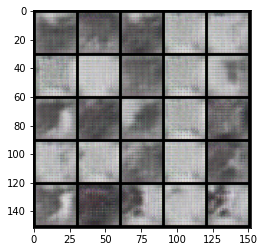

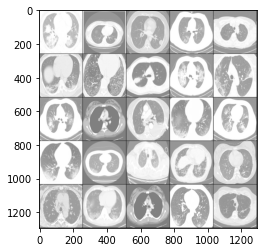

Step 4000: Generator loss: 0.2783917322158813, discriminator loss: 0.27696212220191957


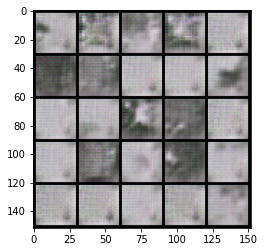

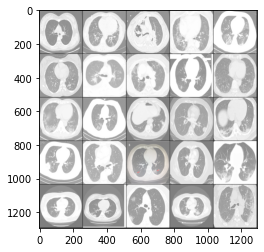

Step 4200: Generator loss: 0.2783710181713105, discriminator loss: 0.277361011981964


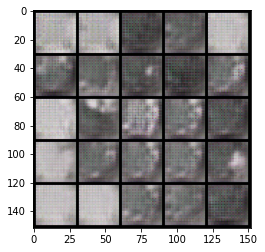

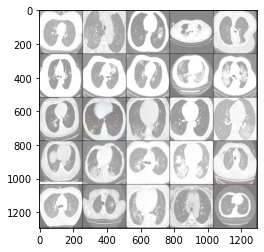

Step 4400: Generator loss: 0.2785042554140094, discriminator loss: 0.27725371086597456


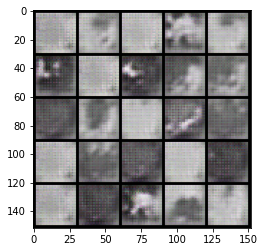

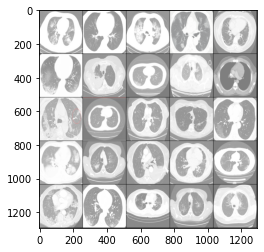

Step 4600: Generator loss: 0.27828006279468537, discriminator loss: 0.2770843536853791


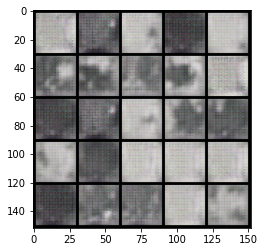

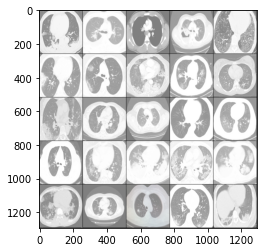

Step 4800: Generator loss: 0.2785424307584763, discriminator loss: 0.2770553804636002


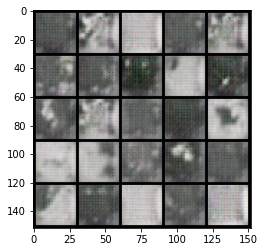

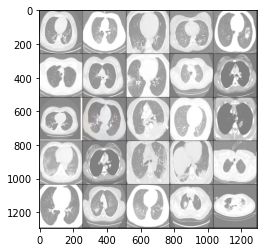

Step 5000: Generator loss: 0.27882555854320545, discriminator loss: 0.2771836860179901


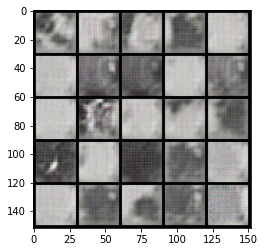

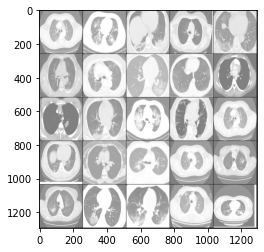

Step 5200: Generator loss: 0.2780540400743484, discriminator loss: 0.2772701826095579


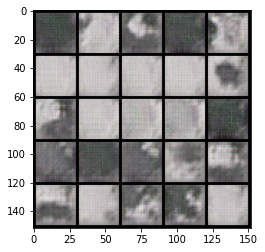

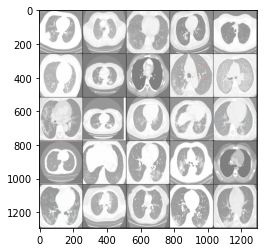

Step 5400: Generator loss: 0.2781004146337509, discriminator loss: 0.27720011055469507


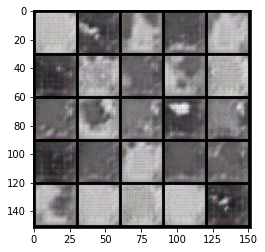

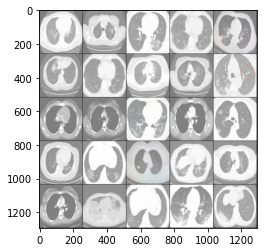

Step 5600: Generator loss: 0.27791896855831155, discriminator loss: 0.2771537516117094


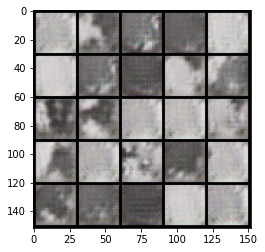

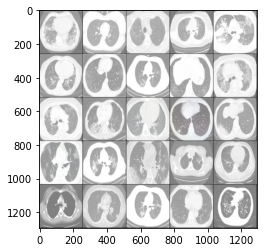

Step 5800: Generator loss: 0.2779420530796051, discriminator loss: 0.2771840302944183


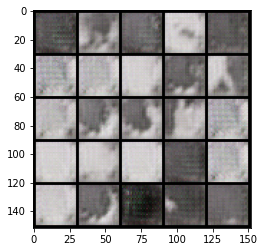

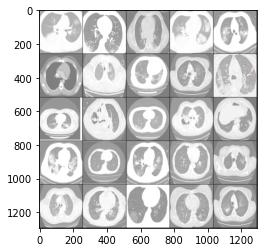

Step 6000: Generator loss: 0.2782148846387863, discriminator loss: 0.27719151651859303


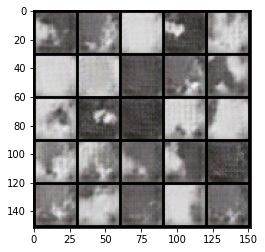

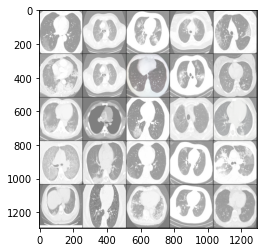

Step 6200: Generator loss: 0.278154568910599, discriminator loss: 0.27714558088779445


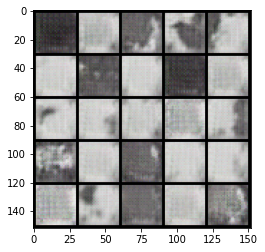

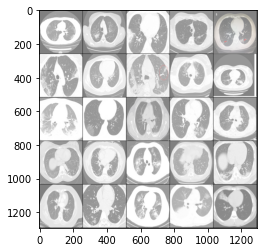

Step 6400: Generator loss: 0.2779876099824905, discriminator loss: 0.27715375471115117


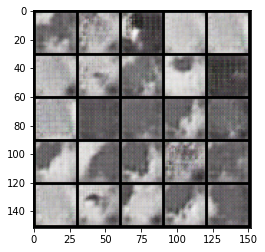

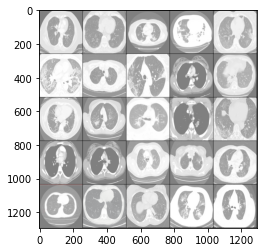

Step 6600: Generator loss: 0.2782576267719269, discriminator loss: 0.27719729399681087


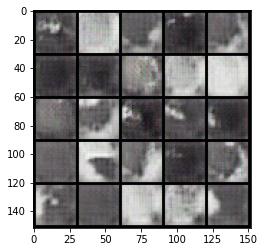

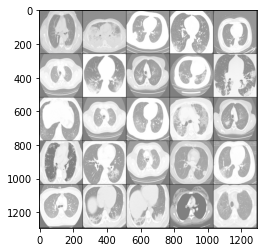

Step 6800: Generator loss: 0.2783307527303696, discriminator loss: 0.27711970722675333


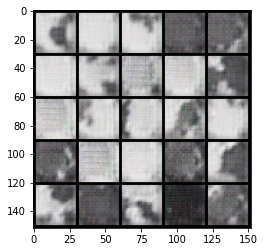

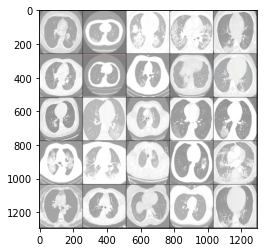

Step 7000: Generator loss: 0.2782089027166365, discriminator loss: 0.27710777723789226


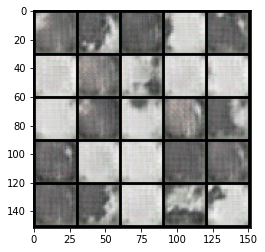

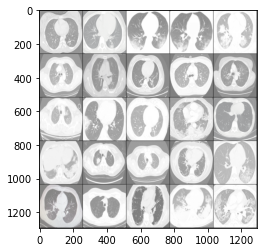

Step 7200: Generator loss: 0.2783048405647276, discriminator loss: 0.2771667717695236


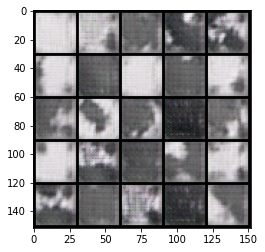

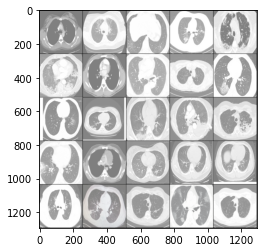

Step 7400: Generator loss: 0.2782823178768156, discriminator loss: 0.2771655399799347


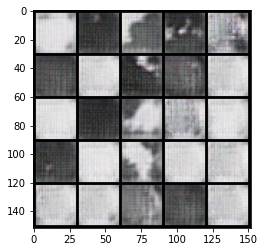

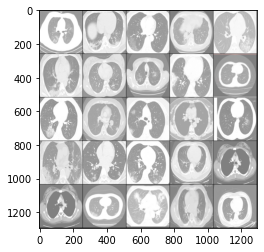

Step 7600: Generator loss: 0.2780342377424238, discriminator loss: 0.27710549759864794


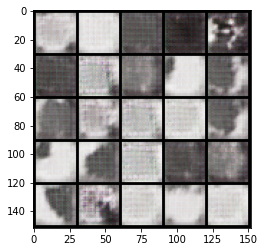

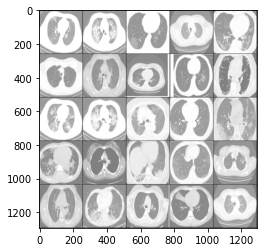

Step 7800: Generator loss: 0.2782118372917174, discriminator loss: 0.27718156862258914


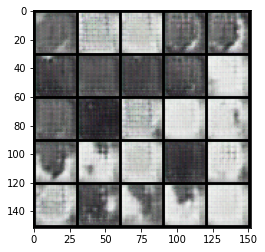

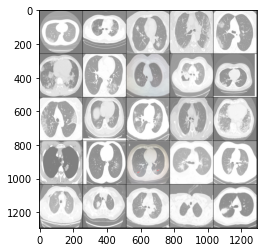

Step 8000: Generator loss: 0.2782812634706496, discriminator loss: 0.2770945590734482


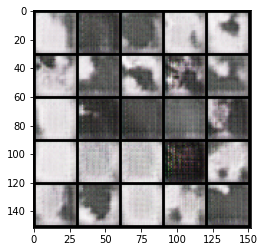

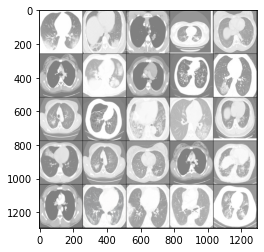

Step 8200: Generator loss: 0.27805127775669086, discriminator loss: 0.27766876995563505


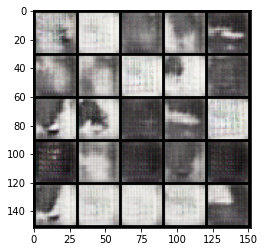

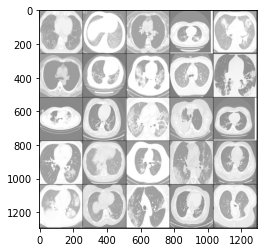

Step 8400: Generator loss: 0.277823080301285, discriminator loss: 0.2774245656728744


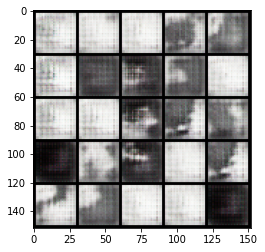

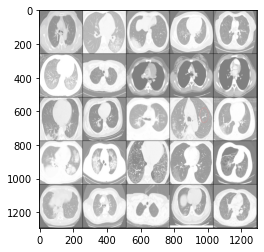

Step 8600: Generator loss: 0.2782464412450789, discriminator loss: 0.2773106207847594


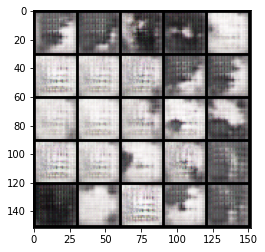

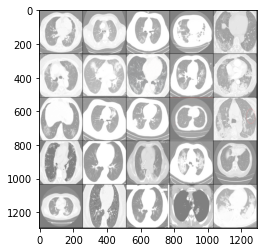

Step 8800: Generator loss: 0.27880979669094075, discriminator loss: 0.2772244528532028


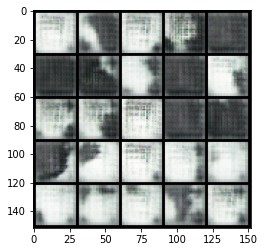

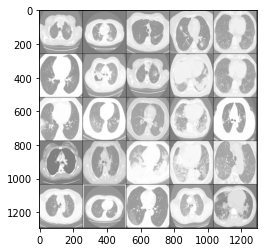

Step 9000: Generator loss: 0.2785620477199554, discriminator loss: 0.27752170419693006


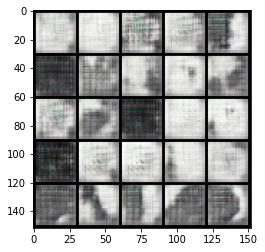

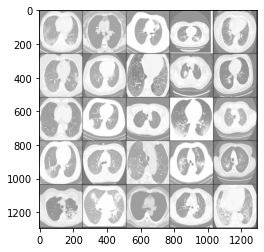

Step 9200: Generator loss: 0.2778623559474945, discriminator loss: 0.2774131834506988


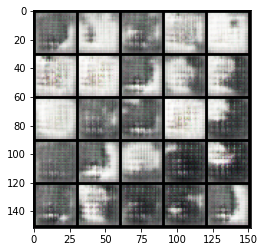

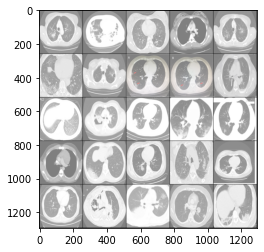

Step 9400: Generator loss: 0.2777602220773697, discriminator loss: 0.2773577023744584


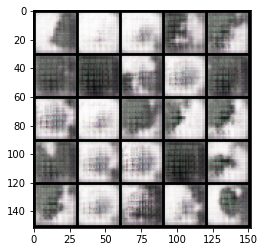

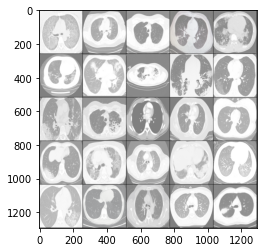

Step 9600: Generator loss: 0.27802906835079194, discriminator loss: 0.2772520838975908


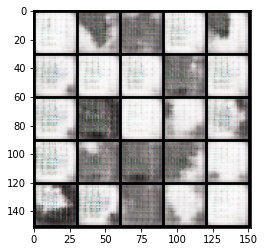

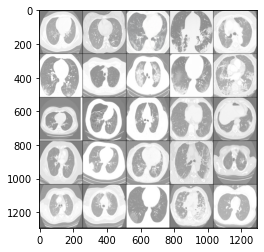

Step 9800: Generator loss: 0.2776175127029419, discriminator loss: 0.27714521455764757


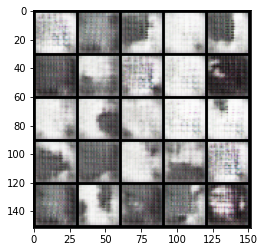

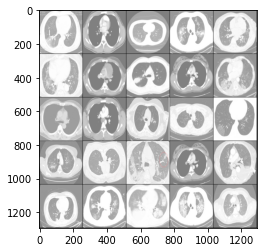

In [ ]:
n_epochs = 5000
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in train_loader:
        cur_batch_size = len(real)
        real = real.to(device)

        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step
        # Update gradients
        disc_loss.backward(retain_graph=True)
        # Update optimizer
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ## Visualization code ##
        if cur_step % 200 == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1